![ga4](https://www.google-analytics.com/collect?v=2&tid=G-6VDTYWLKX6&cid=1&en=page_view&sid=1&dl=statmike%2Fvertex-ai-mlops%2FWorking+With+Document+AI&dt=Document+AI+-+BigQuery+Response+Processing.ipynb)

# Document AI - BigQuery Response Processing
> From the [Working With Document AI](https://github.com/statmike/vertex-ai-mlops/blob/main/Working%20With/Document%20AI/readme.md) series in the [vertex-ai-mlops](https://github.com/statmike/vertex-ai-mlops/blob/main/readme.md) repository.

Document AI is an API where you interact with processors to extract information from documents.  You enable the API, create an instance of a processor in your project, send in document(s), receive back JSON with the extracted information:

<p align="center" width="100%"><center>
    <img src="../../architectures/architectures/images/working with/documentai/readme/high_level.png">
</center></p>

---

**Processing**

A prior workflow covers all the ways to process a document, or many documents, using Python as the client: [Document AI - Process Documents](./Document%20AI%20-%20Process%20Documents.ipynb). It also shows how to store and retrieve responses from GCS and BigQuery.

---

**Responses**

The response is a nested structure that describes the extracted elements of the document.  Another prior workflow covers techniques to extract elements from the responses: [Document AI - Process Responses](./Document%20AI%20-%20Process%20Responses.ipynb)

**This workflow** revisits using BigQuery SQL to extract elements for the response.  That means storing the response in BigQuery as a JSON data type and then using SQL syntax to extract parts of the response withing pages: blocks, paragraphs, lines, tokens.  Even the image of the pages will be extracted and annotated locally in this notebook.

**Advanced** ideas are also presented like creating custom groupings of tokens using geospatial functions in BigQuery!

---

**References:**
- [Python Client For Document AI](https://cloud.google.com/python/docs/reference/documentai/latest)
    - [documentai.Document()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document)
- [Document AI Overview](https://cloud.google.com/document-ai/docs/overview)
    - [Handling the processing response](https://cloud.google.com/document-ai/docs/handle-response)
- BigQuery:
    - [BigQuery SQL](https://cloud.google.com/bigquery/docs/query-overview)
    - [BigQuery Geospatial Analytics](https://cloud.google.com/bigquery/docs/geospatial-intro)
    - [BigQuery JSON Data](https://cloud.google.com/bigquery/docs/json-data)
    - [BigQuery SQL Refernece](https://cloud.google.com/bigquery/docs/reference/standard-sql/query-syntax)
    - [Python Client For BigQuery](https://cloud.google.com/python/docs/reference/bigquery/latest)

---
## Colab Setup

To run this notebook in Colab click [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Working%20With/Document%20AI/Document%20AI%20-%20Process%20Responses.ipynb) and run the cells in this section.  Otherwise, skip this section.

This cell will authenticate to GCP (follow prompts in the popup).

In [935]:
PROJECT_ID = 'statmike-mlops-349915' # replace with project ID

In [1]:
try:
    import google.colab
    from google.colab import auth
    auth.authenticate_user()
    !gcloud config set project {PROJECT_ID}
except Exception:
    pass

---
## Installs and API Enablement

The clients packages may need installing in this environment. 

### Installs (If Needed)

In [2]:
# tuples of (import name, install name)
packages = [
    ('google.cloud.documentai', 'google-cloud-documentai'),
    ('google.cloud.documentai_toolbox', 'google-cloud-documentai-toolbox'),
    ('google.cloud.storage', 'google-cloud-storage'),
    ('google.cloud.bigquery', 'google-cloud-bigquery'),
    ('PIL', 'Pillow'),
    ('PyPDF2', 'PyPDF2')
]

import importlib
install = False
for package in packages:
    if not importlib.util.find_spec(package[0]):
        print(f'installing package {package[1]}')
        install = True
        !pip install {package[1]} -U -q --user

### API Enablement

In [3]:
!gcloud services enable documentai.googleapis.com

### Restart Kernel (If Installs Occured)

After a kernel restart the code submission can start with the next cell after this one.

In [4]:
if install:
    import IPython
    app = IPython.Application.instance()
    app.kernel.do_shutdown(True)

---
## Setup

Inputs

In [5]:
project = !gcloud config get-value project
PROJECT_ID = project[0]
PROJECT_ID

'statmike-mlops-349915'

In [6]:
REGION = 'us-central1'
SERIES = 'working-with-docai'
EXPERIMENT = 'process-responses'

# make this the gcs bucket for storing files
GCS_BUCKET = PROJECT_ID

# BigQuery Objects
BQ_PROJECT = PROJECT_ID
BQ_DATASET = SERIES.replace('-', '_')
BQ_TABLE_PREFIX = EXPERIMENT

Packages

In [7]:
import os, io, json

import PyPDF2
import IPython
import PIL, PIL.ImageFont, PIL.Image, PIL.ImageDraw

from google.cloud import documentai
from google.cloud import documentai_toolbox
from google.cloud import storage
from google.cloud import bigquery

Clients

In [8]:
# document AI client
LOCATION = REGION.split('-')[0]
docai = documentai.DocumentProcessorServiceClient(
    client_options = dict(api_endpoint = f"{LOCATION}-documentai.googleapis.com")
)

# gcs client: assumes bucket already exists
gcs = storage.Client(project = PROJECT_ID)
bucket = gcs.bucket(GCS_BUCKET)

# bq client
bq = bigquery.Client(project = PROJECT_ID)

---
## Get The Document

This section prepares a document for processing with online processing.

|Document Name|Link|
|---|---|
|`../shared files/docs/sports/Baseball - Wikipedia.pdf`|[https://en.wikipedia.org/wiki/Baseball](https://en.wikipedia.org/wiki/Baseball)|

If you are working from a clone of this notebooks repository then the document is already present. The following cell checks for the documents folder, `../shared_files/docs`, and if it is missing gets the document used in this workflow (`wget`):

In [9]:
file = '../shared files/docs/sports/Baseball - Wikipedia.pdf'

if not os.path.exists(file):
    print('Retrieving document...')
    if not os.path.exists(os.path.dirname(file)):
      os.makedirs(os.path.dirname(file))
    import requests, urllib.parse
    r = requests.get(f'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Working%20With/{urllib.parse.quote(file[3:])}')
    open(file, 'wb').write(r.content)
    print(f'Document now at `{file}`')
else:
    print(f'Document Found at `{file}`')

Document Found at `../shared files/docs/sports/Baseball - Wikipedia.pdf`


---
## Create/Get A Processor

For this workflow we will use the [OCR parser](https://cloud.google.com/document-ai/docs/processors-list#processor_doc-ocr). We can check for an existing processor in the project that the OCR Parser with desired version and if it is not present then create one.  The processor will be connected with Python variable `PARSER` and referred to as a parser as it is used.

Get the type and version from the list of available processors: https://cloud.google.com/document-ai/docs/processors-list

What are the processors already created in this project environment?

In [10]:
processors = list(docai.list_processors(parent = f'projects/{PROJECT_ID}/locations/{LOCATION}'))
len(processors)

4

In [11]:
TYPE = 'OCR_PROCESSOR'
VERSION = 'pretrained-ocr-v2.0-2023-06-02'

Get an existing processor:

In [12]:
PARSER = ''
for processor in processors:
    if processor.type_ == TYPE and processor.default_processor_version.split('/')[-1] == VERSION:
        PARSER = processor
        break
        
if PARSER:
    print(f'There is an existing processor with the desire type and version in PARSER = {PARSER.display_name}')
else:
    print(f'Need to create a processor for the desired type and version: {TYPE}, {VERSION}')

There is an existing processor with the desire type and version in PARSER = working-with-docai


Create the processor if an existing one was not found to match:

In [13]:
if not PARSER:
    PARSER = docai.create_processor(
        parent = f'projects/{PROJECT_ID}/locations/{LOCATION}',
        processor = documentai.Processor(
            display_name = SERIES,
            type_ = TYPE
        )
    )
    set_default = docai.set_default_processor_version(
        request = documentai.SetDefaultProcessorVersionRequest(
            processor = PARSER.name,
            default_processor_version = f'{PARSER.name}/processorVersions/{VERSION}'
        )
    )
    set_default.result()
    PARSER = docai.get_processor(
        name = PARSER.name
    )
    print(f'Processor created and in PARSER variable with display name = {PARSER.display_name}')

---
## Online Processing (single document)

> A prior workflow covered all the ways to process a document, or many documents, using Python as the client: [Document AI - Process Documents](./Document%20AI%20-%20Process%20Documents.ipynb). It also shows how to store and retrieve responses from GCS and BigQuery.

This section uses one of the three online processing methods: `inline_document` where the document is provided as a bytes object.

> NOTE: The [OCR Processor](https://cloud.google.com/document-ai/docs/processors-list#processor_doc-ocr) has pages limits of 15 for online, and 500 for batch processing.

The following is the Python client reference to use for this online processing section:
- [google.cloud.documentai.DocumentProcessorServiceClient.process_document()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.services.document_processor_service.DocumentProcessorServiceClient#google_cloud_documentai_v1_services_document_processor_service_DocumentProcessorServiceClient_process_document)

Using the processor stored in `PARSER` from above:

In [14]:
PARSER.name

'projects/1026793852137/locations/us/processors/d59e19cc08278630'

Read the document to a bytes object:

In [15]:
with open(file, 'rb') as f:
    local_doc = f.read()

In [16]:
type(local_doc)

bytes

---
### Document as bytes: `inline_document`

Reference:
- [documentai.ProcessRequest()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.ProcessRequest)
    - (This One) `inline_document` = [documentai.Document()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document)
    - `raw_document` = [documentai.RawDocument()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.RawDocument)
    - `gcs_document` = [documentai.GcsDocument()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.GcsDocument)

In [17]:
response = docai.process_document(
    request = documentai.ProcessRequest(
        name = PARSER.name,
        inline_document = documentai.Document(
            content = local_doc,
            mime_type = 'application/pdf'
        ),
        process_options = documentai.ProcessOptions(
            from_start = 5,
            ocr_config = documentai.OcrConfig(
                enable_symbol = True,
                enable_image_quality_scores = True,
                premium_features = documentai.OcrConfig.PremiumFeatures(
                    compute_style_info = True
                )
            )
        )
    )
)

In [18]:
len(response.document.pages)

5

In [19]:
print(response.document.text[0:250])

10/27/23, 9:22 AM
Baseball - Wikipedia
WIKIPEDIA
The Free Encyclopedia
Toggle the table of contents
Baseball
✰ B
ETTS
Baseball is a bat-and-ball sport played between two
Baseball
teams of nine players each, taking turns batting and
fielding. The game


---
## Extraction: BigQuery To Store, Retrieve, and Query

What if the responses are stored in BigQuery?  This makes a great location for storage and recall due to the native JSON data type. It can also be a great place for processing the extraction by using the native JSON functions!

---

**Why BigQuery For Document AI**

It makes an incredibly efficient interface for working with document extraction.  The response from a document parser may be helpful **later** as there may be additional information that needs extracting and storing the result in BigQuery.  Once the results are in BigQuery they are available **on demand** for extraction, with logic, from nearly anywhere your **workflow** needs to connect from.  Retrieving information take the form of SQL which can **apply logic to all documents, pages, components** that meet the specified `WHERE` condition of the statement.  This can be powerful for **re-extraction** across large number of documents.  Also, **multi-document extraction** logic can also work bottom-up, like finding all the document with matching entity types. And a favorite, complex document extraction, like **creating custom components** from tokens, lines, and paragraphs based on relative position on a page.

---

BigQuery is a great place to store, retrieve, and even query the json data from Document AI:
- Import Data:
    - [Load JSON data from GCS](https://cloud.google.com/bigquery/docs/loading-data-cloud-storage-json)
- Retrieve Data:
    - [Python Client for BigQuery](https://cloud.google.com/python/docs/reference/bigquery/latest)
        - Use SQL from Python to retrieve results to Pandas dataframes
    - [BigFrames Client for BigQuery](https://cloud.google.com/python/docs/reference/bigframes/latest)
        - Use Pandas like API to retrieve results to Pandas dataframe
    - [Python Client for Google BigQuery Storage API](https://cloud.google.com/python/docs/reference/bigquerystorage/latest)
        - A client for directly injesting data from BigQuery storage without the compute of a query.
- Query Data Inside BigQuery:
    - BigQuery has a native data type for JSON: [BigQuery JSON type](https://cloud.google.com/bigquery/docs/reference/standard-sql/data-types#json_type)
    - [Query JSON data](https://cloud.google.com/bigquery/docs/json-data#query_json_data)
    - All of [Google SQL](https://cloud.google.com/bigquery/docs/reference/standard-sql/query-syntax)

### Store The Response In BigQuery

#### Create/Get BigQuery Dataset

In [94]:
ds = bigquery.DatasetReference(BQ_PROJECT, BQ_DATASET)
ds.location = REGION[0:2] # use multi-region if creating new
ds.labels = {'series': f'{SERIES}'}
ds = bq.create_dataset(dataset = ds, exists_ok = True)

#### Prepare JSON Input

In [95]:
dict_response = documentai.Document.to_dict(response.document, use_integers_for_enums = False)

In [96]:
dict_response = dict(
    process = dict(
        method = 'online',
        file = file,
        processor = dict(
            display_name = PARSER.display_name,
            parser_type = PARSER.type_,
            name = PARSER.name,
            version = PARSER.default_processor_version
        )
    ),
    response = dict_response
)

#### Load JSON To BigQuery Table

In [97]:
# make load job configuration
job_config = bigquery.LoadJobConfig(
    source_format = bigquery.SourceFormat.NEWLINE_DELIMITED_JSON,
    write_disposition = bigquery.WriteDisposition.WRITE_TRUNCATE, #.WRITE_APPEND, #.WRITE_TRUNCATE, #.WRITE_EMPTY
    create_disposition = bigquery.CreateDisposition.CREATE_IF_NEEDED, #.CREATE_NEVER
    #schema_update_options = [bigquery.SchemaUpdateOption.ALLOW_FIELD_ADDITION],
    autodetect = True
)    

# save files_pages
load_job = bq.load_table_from_json(
    json_rows = [dict_response],
    destination = ds.table(BQ_TABLE_PREFIX),
    job_config = job_config
)
load_job.result()

LoadJob<project=statmike-mlops-349915, location=US, id=fc4e6502-e52b-4b62-89ea-73a0634ec76d>

### Query The Response - Example

In [98]:
query = bq.query(query = f'SELECT process FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`')

In [99]:
[dict(row) for row in query][0]

{'process': {'processor': {'name': 'projects/1026793852137/locations/us/processors/d59e19cc08278630',
   'version': 'projects/1026793852137/locations/us/processors/d59e19cc08278630/processorVersions/pretrained-ocr-v2.0-2023-06-02',
   'parser_type': 'OCR_PROCESSOR',
   'display_name': 'working-with-docai'},
  'file': '../shared files/docs/sports/Baseball - Wikipedia.pdf',
  'method': 'online'}}

### Reload `documentai.Document` Object From BigQuery

This would allow retrieval for local extraction in Python using the methods demonstrated above:
- Python Client for Document AI
    - Also, conversion to types that can be iterated in Python like JSON or dictionary
- Document AI Toolbook

In [100]:
reload = bq.query(query = f'''
SELECT
    TO_JSON_STRING(response) as json_string
FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`
WHERE process.file = '{file}'
''')

In [101]:
reload = [dict(row) for row in reload][0]

In [102]:
reload = documentai.Document.from_json(
    reload['json_string'],
    ignore_unknown_fields = True
)

In [103]:
type(reload)

google.cloud.documentai_v1.types.document.Document

In [104]:
len(reload.pages)

5

In [105]:
print(reload.text[0:250])

10/27/23, 9:22 AM
Baseball - Wikipedia
WIKIPEDIA
The Free Encyclopedia
Toggle the table of contents
Baseball
✰ B
ETTS
Baseball is a bat-and-ball sport played between two
Baseball
teams of nine players each, taking turns batting and
fielding. The game


## Extraction: Directly In BigQuery with SQL

Repeating all the steps shown above for the Python Client.

#### Python Helper Function

This is a simple function to process SQL queries for an input `SELECT` statement and return a dictionary or results:

In [138]:
def extractor(selector):
    return [
        dict(row) for row in bq.query(query = f'''
            SELECT
                {selector}
            FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`
            WHERE process.file = '{file}'
        '''
        )
    ]

In [139]:
extractor('response.mime_type as mime_type')[0]

{'mime_type': 'application/pdf'}

### OCR Text: document.text

In [140]:
print(extractor('SUBSTRING(response.text, 0, 500) as text')[0]['text'])

10/27/23, 9:22 AM
Baseball - Wikipedia
WIKIPEDIA
The Free Encyclopedia
Toggle the table of contents
Baseball
✰ B
ETTS
Baseball is a bat-and-ball sport played between two
Baseball
teams of nine players each, taking turns batting and
fielding. The game occurs over the course of several
plays, with each play generally beginning when a player
on the fielding team, called the pitcher, throws a ball
that a player on the batting team, called the batter, tries
to hit with a bat. The objective of the off


### Pages

How many pages?

In [141]:
extractor('ARRAY_LENGTH(response.pages) as pages')

[{'pages': 5}]

Pick a single page, the first one:

In [142]:
page_index = 0

In [143]:
extractor(f'response.pages[{page_index}].page_number as page_number')

[{'page_number': 1}]

What are the physical characteristics of the page? Layout and size (in pixels)?
- [documentai.Document.Page.Dimension()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Dimension)
- [documentai.Document.Page.Layout()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Layout)

In [144]:
extractor(f'response.pages[{page_index}].dimension as dimension')

[{'dimension': {'unit': 'pixels', 'height': 2275.0, 'width': 1758.0}}]

In [145]:
extractor(f'response.pages[{page_index}].layout as layout')

[{'layout': {'orientation': 'PAGE_UP',
   'confidence': 0.0,
   'bounding_poly': {'normalized_vertices': [{'y': 0.0, 'x': 0.0},
     {'y': 0.0, 'x': 1.0},
     {'y': 1.0, 'x': 1.0},
     {'y': 1.0, 'x': 0.0}],
    'vertices': [{'y': 0, 'x': 0},
     {'y': 0, 'x': 1758},
     {'y': 2275, 'x': 1758},
     {'y': 2275, 'x': 0}]},
   'text_anchor': {'content': '',
    'text_segments': [{'start_index': 0, 'end_index': 2703}]}}}]

What languages are used within the pages text?
- [documenai.Document.Page.DetectedLanguage()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.DetectedLanguage)

In [146]:
extractor(f'response.pages[{page_index}].detected_languages as detected_languages')

[{'detected_languages': [{'confidence': 0.97781765, 'language_code': 'en'},
   {'confidence': 0.022182323, 'language_code': 'und'}]}]

What is the text on the page?

Use the pages `text_anchor` and `text_segments` list to get the range of characters from `response.document.text` that contain the pages text.  When the `start_index` is missing from `text_anchor` is means start at 0.

In [147]:
print(extractor(f'SUBSTRING(response.text,0,response.pages[{page_index}].layout.text_anchor.text_segments[0].end_index) as text')[0]['text'])

10/27/23, 9:22 AM
Baseball - Wikipedia
WIKIPEDIA
The Free Encyclopedia
Toggle the table of contents
Baseball
✰ B
ETTS
Baseball is a bat-and-ball sport played between two
Baseball
teams of nine players each, taking turns batting and
fielding. The game occurs over the course of several
plays, with each play generally beginning when a player
on the fielding team, called the pitcher, throws a ball
that a player on the batting team, called the batter, tries
to hit with a bat. The objective of the offensive team
(batting team) is to hit the ball into the field of play,
away from the other team's players, allowing its players
to run the bases, having them advance counter-
clockwise around four bases to score what are called
"runs". The objective of the defensive team (referred to
as the fielding team) is to prevent batters from
becoming runners, and to prevent runners' advance
around the bases. [2] A run is scored when a runner
Boston Red Sox player Mookie Betts hits a
legally advances around

What does the page look like?
- [documentai.Document.Page.Image()](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Image)

In [148]:
image_info = extractor(f'''
    response.pages[{page_index}].image.width as width,
    response.pages[{page_index}].image.height as height,
    response.pages[{page_index}].image.mime_type as mime_type,
'''
)[0]
image_info

{'width': 1758, 'height': 2275, 'mime_type': 'image/png'}

In [149]:
image_bytes = extractor(f'response.pages[{page_index}].image.content as image')[0]['image']

In [150]:
type(image_bytes)

bytes

In [151]:
image = PIL.Image.open(io.BytesIO(image_bytes))

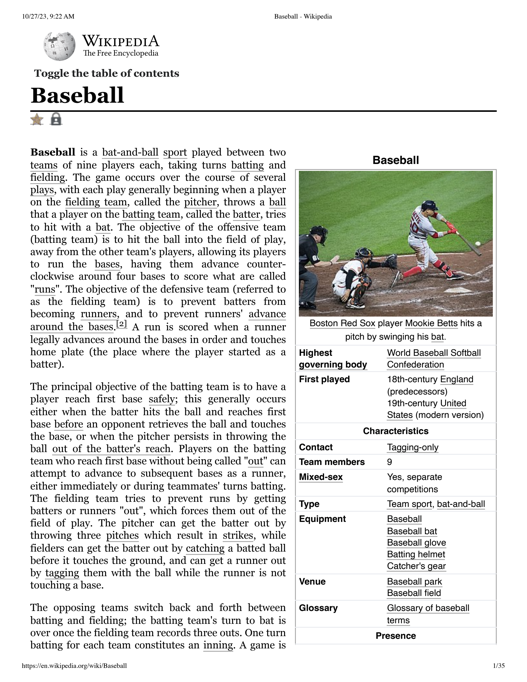

In [152]:
IPython.display.display(
    image.resize(
        (int(.3 * image_info['width']), int(.3 * image_info['height']))
    )
)

What is the quality of the pages image?
- [documentai.Document.Page.ImageQualityScores](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.ImageQualityScores)

In [153]:
extractor(f'response.pages[{page_index}].image_quality_scores as image_quality_scores')[0]

{'image_quality_scores': {'detected_defects': [{'confidence': 1.0,
    'type_': 'quality/defect_document_cutoff'},
   {'confidence': 0.635657, 'type_': 'quality/defect_glare'},
   {'confidence': 0.5, 'type_': 'quality/defect_text_cutoff'}],
  'quality_score': 0.9518429}}

In [154]:
extractor(f'response.pages[{page_index}].detected_barcodes as detected_barcodes')[0]

{'detected_barcodes': []}

In [155]:
extractor(f'response.pages[{page_index}].visual_elements as visual_elements')[0]

{'visual_elements': []}

In [156]:
extractor(f'response.pages[{page_index}].tables as tables')[0]

{'tables': []}

In [157]:
extractor(f'response.pages[{page_index}].form_fields as form_fields')[0]

{'form_fields': []}

Page text from **all pages** in a file:
> A single BigQuery query that retrieves all pages from a response and substrings the full OCR of the document for each `text_segment` for the page while aggregating the segments in each page as a string with the full text of the page.

In [158]:
query = f'''
    SELECT
        process.file as file,
        pages.page_number as page_number,
        STRING_AGG(
            SUBSTRING(
                response.text,
                segments.start_index,
                segments.end_index - segments.start_index
            )
        ) as page_text
    FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`,
        UNNEST(response.pages) AS pages WITH OFFSET AS page,
        UNNEST(pages.layout.text_anchor.text_segments) AS segments WITH OFFSET as segment
    WHERE process.file = '{file}'
    GROUP BY file, page_number
'''
page_text = [dict(row) for row in bq.query(query = query)]

In [159]:
len(page_text)

5

In [160]:
for page in page_text:
    print(f"\n\nThe first 250 characters of page {page['page_number']}:\n\n", page['page_text'][0:250])



The first 250 characters of page 1:

 10/27/23, 9:22 AM
Baseball - Wikipedia
WIKIPEDIA
The Free Encyclopedia
Toggle the table of contents
Baseball
✰ B
ETTS
Baseball is a bat-and-ball sport played between two
Baseball
teams of nine players each, taking turns batting and
fielding. The game


The first 250 characters of page 2:

 
10/27/23, 9:22 AM
Baseball - Wikipedia
Worldwide (most
prominent in the Americas
and East Asia)
usually composed of nine innings, and the team with
Country
the greater number of runs at the end of the game wins. or region
Most games end after the ni


The first 250 characters of page 3:

 
10/27/23, 9:22 AM
Baseball - Wikipedia
scoring by recording outs, which remove opposing players from
offensive action, until their next turn at bat comes up again. When
three outs are recorded, the teams switch roles for the next half-
inning. If th


The first 250 characters of page 4:

 
10/27/23, 9:22 AM
Baseball - Wikipedia
Play starts with a member of the batting team, 

### Python Helper Functions

For extracting components from a page: blocks, paragraphs, lines, tokens, symbols

**NOTE**
This queries all pages of matching documents from the `WHERE` statement - all at once!  

In [162]:
def component_extractor(part):
    
    query = f'''
        WITH components AS (
            SELECT
                process.file as file,
                pages.page_number as page_number,
                {part},
                STRING_AGG(
                    SUBSTRING(
                        response.text,
                        segments.start_index,
                        segments.end_index - segments.start_index
                    )
                ) as text
            FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`,
                UNNEST(response.pages) AS pages WITH OFFSET AS page,
                UNNEST(pages.{part}s) AS {part}s WITH OFFSET AS {part},
                UNNEST({part}s.layout.text_anchor.text_segments) AS segments WITH OFFSET as segment
            WHERE process.file = '{file}'
            GROUP BY file, page_number, {part}
        )
        SELECT
            file,
            page_number,
            ARRAY_AGG(STRUCT({part}, text)) AS {part}s
        FROM components
        GROUP BY file, page_number
    '''
    
    return [dict(row) for row in bq.query(query = query)]

In [163]:
def annotation_extractor(part):
    
    query = f'''
        SELECT
            process.file as file,
            pages.page_number as page_number,
            ANY_VALUE(pages.image) as image,
            ARRAY_AGG(
                STRUCT(
                    {part},
                    {part}s.layout.bounding_poly.normalized_vertices AS vertices
                )
            ) AS {part}s
        FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`,
            UNNEST(response.pages) AS pages WITH OFFSET AS page,
            UNNEST(pages.{part}s) AS {part}s WITH OFFSET AS {part}
        WHERE process.file = '{file}'
        GROUP BY file, page_number
    '''
    
    return [dict(row) for row in bq.query(query = query)]

In [164]:
def annotator(annotations, page_number, component, line_size = 5):
    
    for page in annotations:
        if page['page_number'] == page_number:
            break
    
    annotated_image = PIL.Image.open(io.BytesIO(page['image']['content']))
    draw = PIL.ImageDraw.Draw(annotated_image)
    
    for part in page[component+'s']:
        draw.polygon(
            [(v['x'] * page['image']['width'], v['y'] * page['image']['height']) for v in part['vertices']],
            outline = 'green',
            width = line_size
        )
    
    #IPython.display.display(annotated_image)
    
    return annotated_image

### Pages:Blocks

- [documentai.Document.Page.Block](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Block)

Retrieve all pages and print the results of the first one:

In [165]:
blocks = component_extractor('block')
blocks[0]

{'file': '../shared files/docs/sports/Baseball - Wikipedia.pdf',
 'page_number': 1,
 'blocks': [{'block': 0, 'text': '10/27/23, 9:22 AM\n'},
  {'block': 1, 'text': '\nBaseball - Wikipedia'},
  {'block': 2, 'text': '\nWIKIPEDIA\nThe Free Encyclopedia'},
  {'block': 3, 'text': '\nToggle the table of contents'},
  {'block': 4, 'text': '\nBaseball'},
  {'block': 5, 'text': '\n✰ B'},
  {'block': 6, 'text': '\nETTS'},
  {'block': 7,
   'text': '\nBaseball is a bat-and-ball sport played between two\nBaseball\nteams of nine players each, taking turns batting and\nfielding. The game occurs over the course of several\nplays, with each play generally beginning when a player\non the fielding team, called the pitcher, throws a ball\nthat a player on the batting team, called the batter, tries\nto hit with a bat. The objective of the offensive team\n(batting team) is to hit the ball into the field of play,\naway from the other team\'s players, allowing its players\nto run the bases, having them advan

Retrieve image annotation information for all pages, then annotate the first page:

In [166]:
block_annotations = annotation_extractor('block')

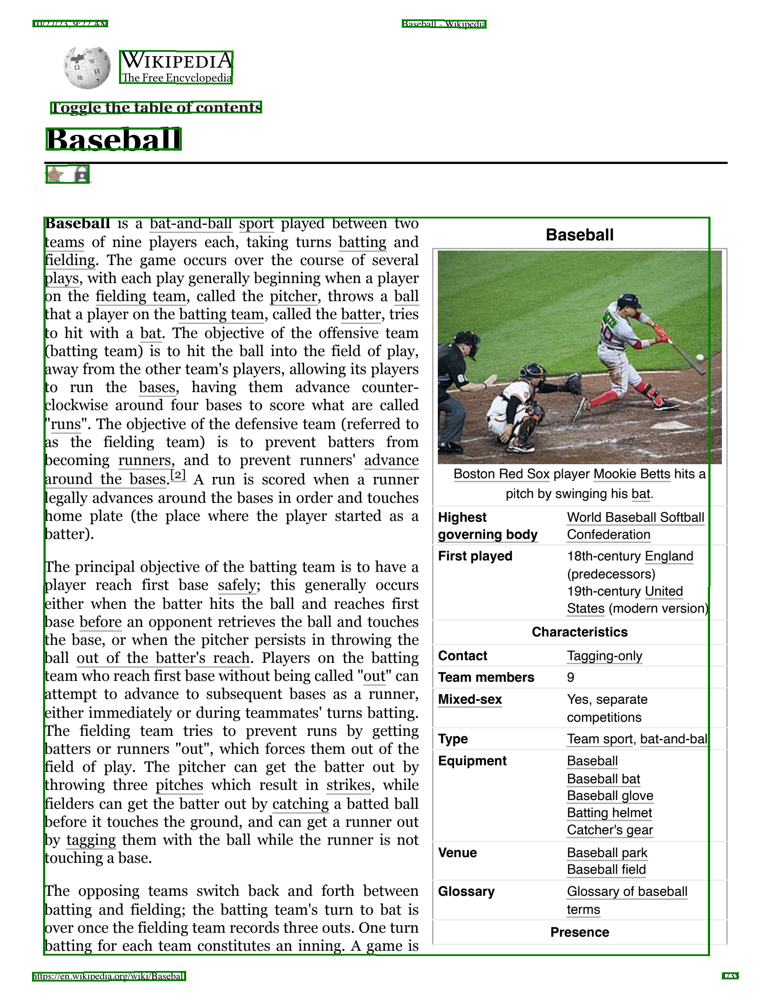

In [167]:
block_image = annotator(block_annotations, 1, 'block')
block_image

### Pages:Paragraphs

- [documentai.Document.Page.Paragraph](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Paragraph)

Retrieve all pages and print the results of the first one:

In [168]:
paragraphs = component_extractor('paragraph')
paragraphs[0]

{'file': '../shared files/docs/sports/Baseball - Wikipedia.pdf',
 'page_number': 1,
 'paragraphs': [{'paragraph': 0, 'text': '10/27/23, 9:22 AM\n'},
  {'paragraph': 1, 'text': '\nBaseball - Wikipedia'},
  {'paragraph': 2, 'text': '\nWIKIPEDIA\nThe Free Encyclopedia'},
  {'paragraph': 3, 'text': '\nToggle the table of contents'},
  {'paragraph': 4, 'text': '\nBaseball'},
  {'paragraph': 5, 'text': '\n✰ B'},
  {'paragraph': 6, 'text': '\nETTS'},
  {'paragraph': 7,
   'text': '\nBaseball is a bat-and-ball sport played between two\nBaseball\nteams of nine players each, taking turns batting and\nfielding. The game occurs over the course of several\nplays, with each play generally beginning when a player\non the fielding team, called the pitcher, throws a ball\nthat a player on the batting team, called the batter, tries\nto hit with a bat. The objective of the offensive team\n(batting team) is to hit the ball into the field of play,\naway from the other team\'s players, allowing its players\

Retrieve image annotation information for all pages, then annotate the first page:

In [169]:
paragraph_annotations = annotation_extractor('paragraph')

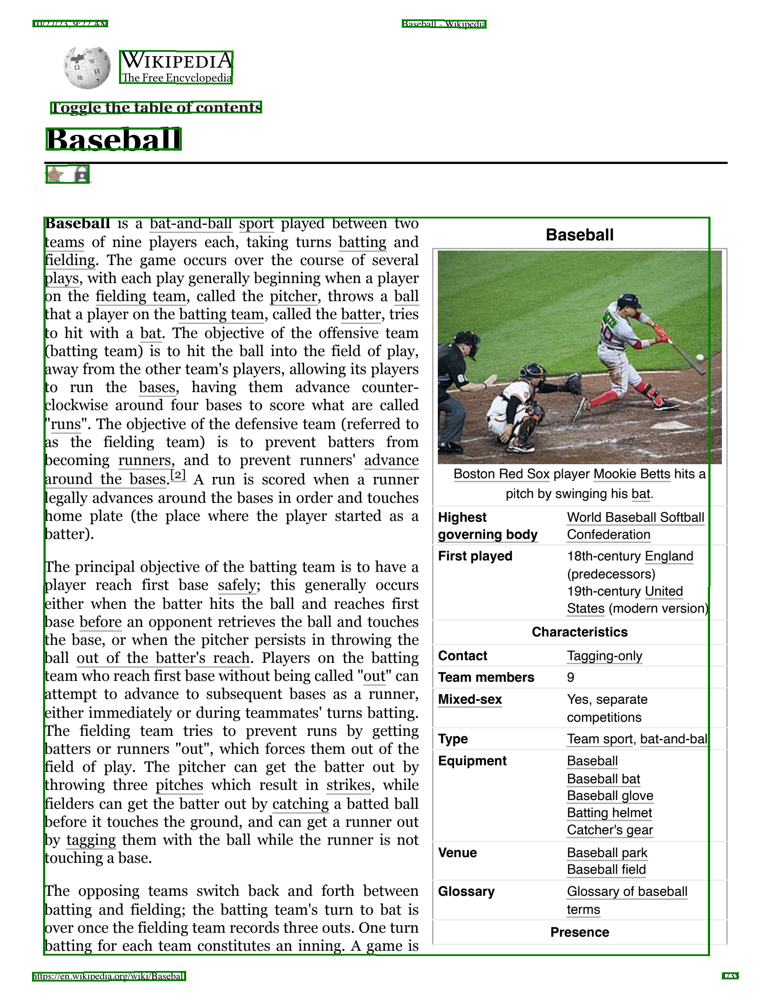

In [170]:
paragraph_image = annotator(paragraph_annotations, 1, 'paragraph')
paragraph_image

### Pages:Lines

- [documentai.Document.Page.Line](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Line)

Retrieve all pages and print the results of the first one:

In [171]:
lines = component_extractor('line')
lines[0]

{'file': '../shared files/docs/sports/Baseball - Wikipedia.pdf',
 'page_number': 1,
 'lines': [{'line': 0, 'text': '10/27/23, 9:22 AM\n'},
  {'line': 1, 'text': '\nBaseball - Wikipedia'},
  {'line': 2, 'text': '\nWIKIPEDIA'},
  {'line': 3, 'text': '\nThe Free Encyclopedia'},
  {'line': 4, 'text': '\nToggle the table of contents'},
  {'line': 5, 'text': '\nBaseball'},
  {'line': 6, 'text': '\n✰ B'},
  {'line': 7, 'text': '\nETTS'},
  {'line': 8, 'text': '\nBaseball is a bat-and-ball sport played between two'},
  {'line': 9, 'text': '\nBaseball'},
  {'line': 10,
   'text': '\nteams of nine players each, taking turns batting and'},
  {'line': 11,
   'text': '\nfielding. The game occurs over the course of several'},
  {'line': 12,
   'text': '\nplays, with each play generally beginning when a player'},
  {'line': 13,
   'text': '\non the fielding team, called the pitcher, throws a ball'},
  {'line': 14,
   'text': '\nthat a player on the batting team, called the batter, tries'},
  {'line':

Retrieve image annotation information for all pages, then annotate the first page:

In [172]:
line_annotations = annotation_extractor('line')

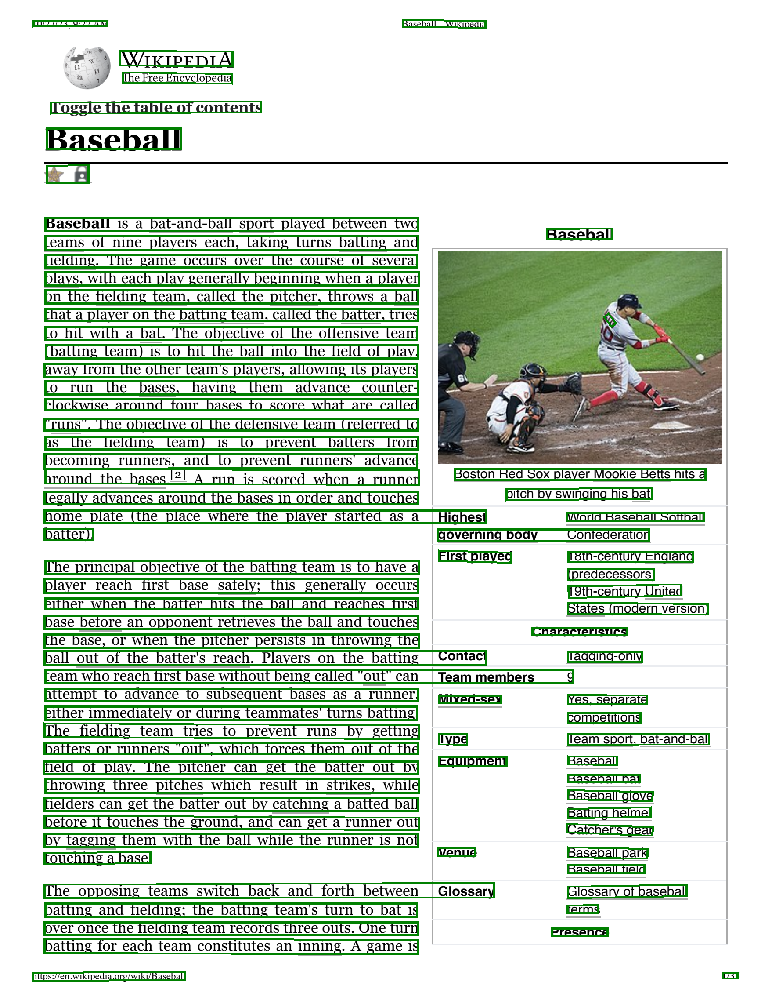

In [173]:
line_image = annotator(line_annotations, 1, 'line')
line_image

### Pages:Tokens

- [documentai.Document.Page.Token](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Token)

Retrieve all pages and print the results of the first one:

In [174]:
tokens = component_extractor('token')
tokens[0]['tokens'][0:50]

[{'token': 0, 'text': '10/27/23'},
 {'token': 1, 'text': '3,'},
 {'token': 2, 'text': ' 9:22'},
 {'token': 3, 'text': ' AM'},
 {'token': 4, 'text': '\nBaseball'},
 {'token': 5, 'text': ' -'},
 {'token': 6, 'text': ' Wikipedia'},
 {'token': 7, 'text': '\nWIKIPEDIA'},
 {'token': 8, 'text': '\nThe'},
 {'token': 9, 'text': ' Free'},
 {'token': 10, 'text': ' Encyclopedia'},
 {'token': 11, 'text': '\nToggle'},
 {'token': 12, 'text': ' the'},
 {'token': 13, 'text': ' table'},
 {'token': 14, 'text': ' of'},
 {'token': 15, 'text': ' contents'},
 {'token': 16, 'text': '\nBaseball'},
 {'token': 17, 'text': '\n✰'},
 {'token': 18, 'text': ' B'},
 {'token': 19, 'text': '\nETTS'},
 {'token': 20, 'text': '\nBaseball'},
 {'token': 21, 'text': ' is'},
 {'token': 22, 'text': ' a'},
 {'token': 23, 'text': ' ba'},
 {'token': 24, 'text': 't'},
 {'token': 25, 'text': '-an'},
 {'token': 26, 'text': 'd'},
 {'token': 27, 'text': '-ball'},
 {'token': 28, 'text': ' sport'},
 {'token': 29, 'text': ' played'},
 {'t

Retrieve image annotation information for all pages, then annotate the first page:

In [175]:
token_annotations = annotation_extractor('token')

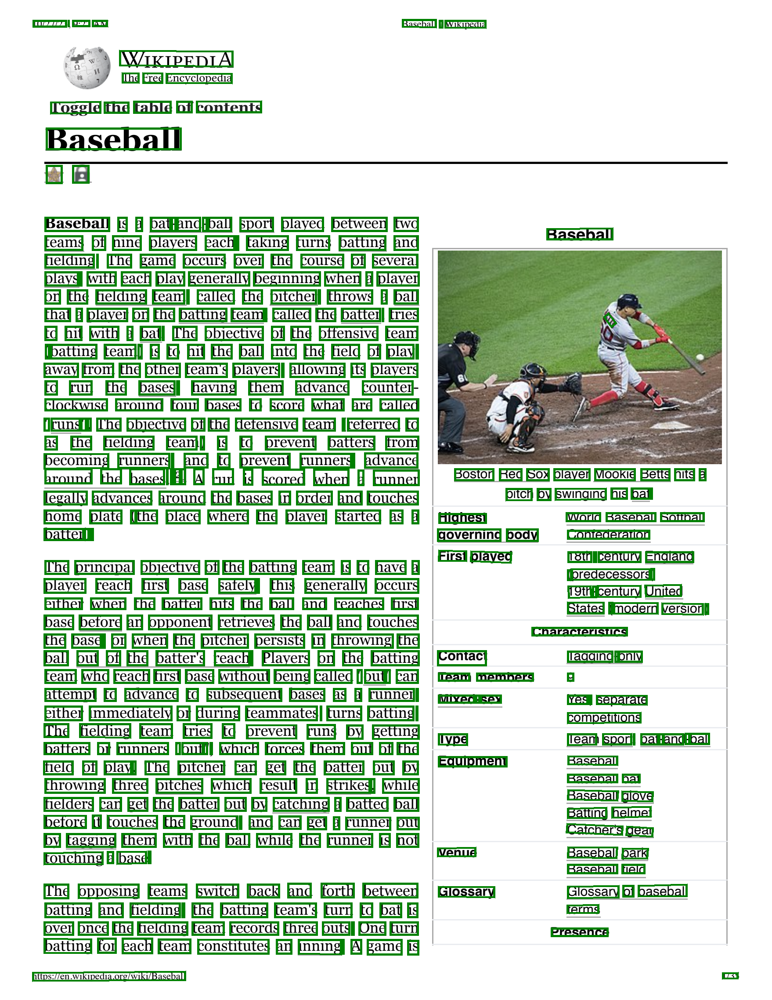

In [176]:
token_image = annotator(token_annotations, 1, 'token')
token_image

### Pages:Symbols

- [documentai.Document.Page.Symbol](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Symbol)

Retrieve all pages and print the results of the first one:

In [177]:
symbols = component_extractor('symbol')
symbols[0]['symbols'][0:50]

[{'symbol': 0, 'text': '1'},
 {'symbol': 1, 'text': '1'},
 {'symbol': 2, 'text': '0'},
 {'symbol': 3, 'text': '/'},
 {'symbol': 4, 'text': '2'},
 {'symbol': 5, 'text': '7'},
 {'symbol': 6, 'text': '/'},
 {'symbol': 7, 'text': '2'},
 {'symbol': 8, 'text': '3'},
 {'symbol': 9, 'text': ' '},
 {'symbol': 10, 'text': '9'},
 {'symbol': 11, 'text': ':'},
 {'symbol': 12, 'text': '2'},
 {'symbol': 13, 'text': ' '},
 {'symbol': 14, 'text': 'A'},
 {'symbol': 15, 'text': '\n'},
 {'symbol': 16, 'text': 'B'},
 {'symbol': 17, 'text': 'a'},
 {'symbol': 18, 'text': 's'},
 {'symbol': 19, 'text': 'e'},
 {'symbol': 20, 'text': 'b'},
 {'symbol': 21, 'text': 'a'},
 {'symbol': 22, 'text': 'l'},
 {'symbol': 23, 'text': ' '},
 {'symbol': 24, 'text': ' '},
 {'symbol': 25, 'text': 'W'},
 {'symbol': 26, 'text': 'i'},
 {'symbol': 27, 'text': 'k'},
 {'symbol': 28, 'text': 'i'},
 {'symbol': 29, 'text': 'p'},
 {'symbol': 30, 'text': 'e'},
 {'symbol': 31, 'text': 'd'},
 {'symbol': 32, 'text': 'i'},
 {'symbol': 33, 'te

Retrieve image an annotation information for all pages, then annotate the first page:

In [178]:
symbol_annotations = annotation_extractor('symbol')

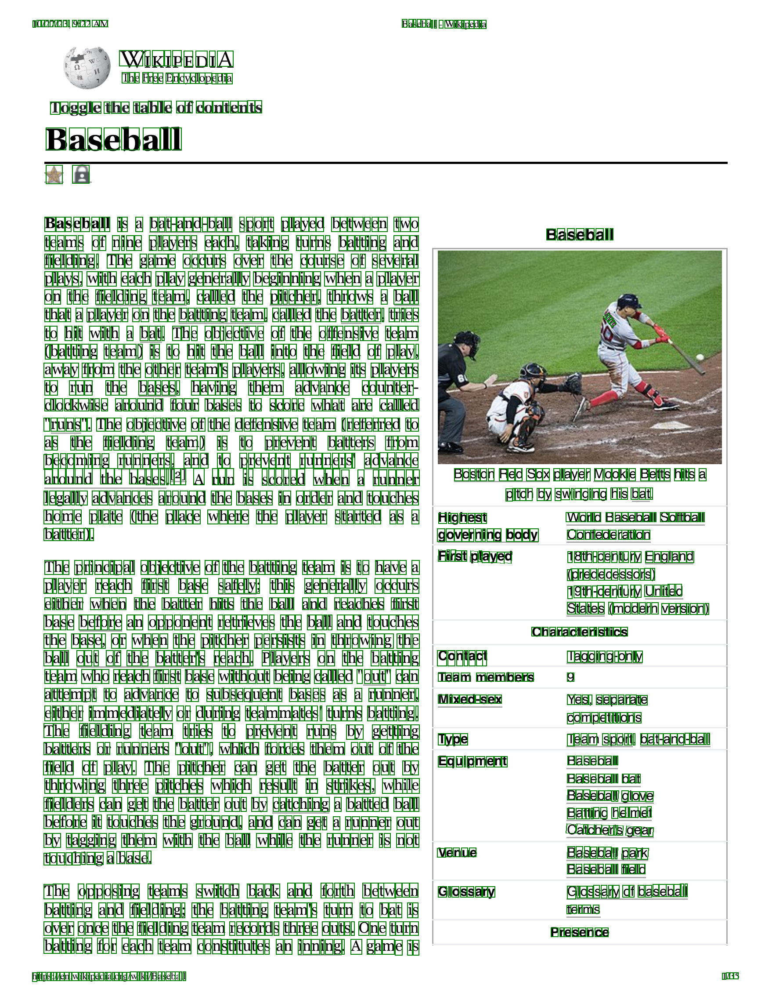

In [179]:
symbol_image = annotator(symbol_annotations, 1, 'symbol', line_size = 2)
symbol_image

### Pages:Tokens:StyleInfo

- [documentai.Document.Page.Token](https://cloud.google.com/python/docs/reference/documentai/latest/google.cloud.documentai_v1.types.Document.Page.Token)

Recall the index of tokens with the word 'Baseball' on the first page:

In [180]:
idx = [i for i, t in enumerate(tokens[0]['tokens']) if t['text'].strip() == 'Baseball']
idx

[4, 16, 20, 32, 225, 390, 403, 414, 455, 461]

Print the first few of these:

In [181]:
[tokens[0]['tokens'][i]['text'] for i in idx[0:3]]

['\nBaseball', '\nBaseball', '\nBaseball']

These look very different on the document - see the first page:

In [182]:
image_info = extractor(f'response.pages[0].image as image')[0]

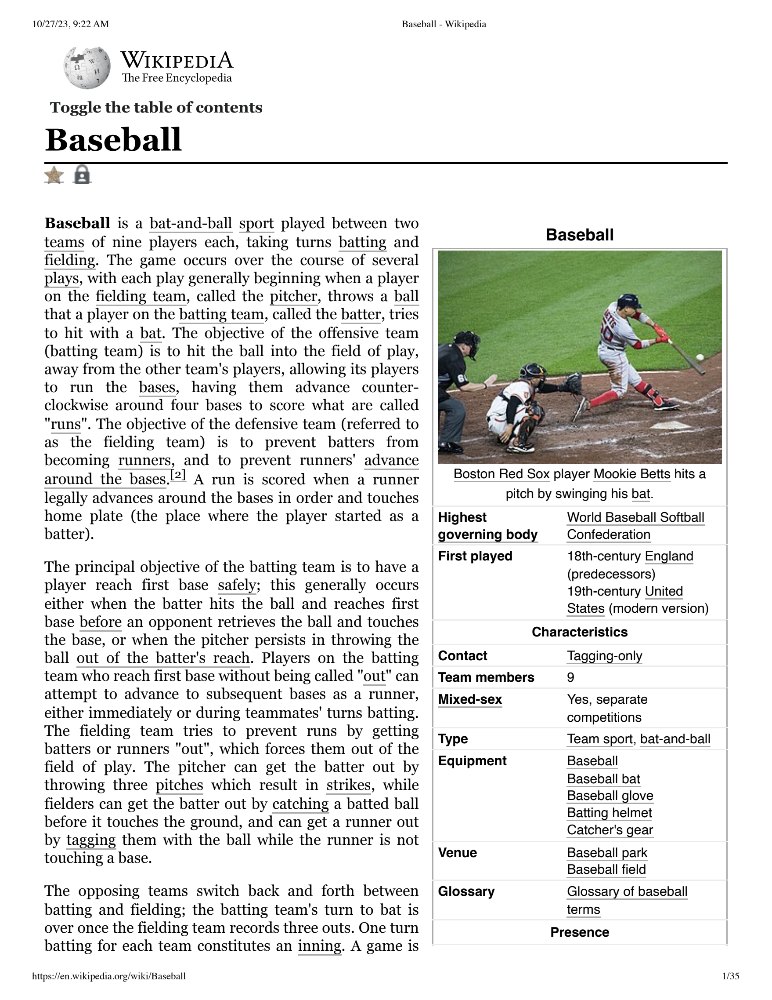

In [183]:
image = PIL.Image.open(io.BytesIO(image_info['image']['content']))
image

While the text is the same, the style on the page is very different.  The processing request included a `process_options` setting for `compute_style_info = True` that includes style info in the response.

```
        process_options = documentai.ProcessOptions(
            from_start = 5,
            ocr_config = documentai.OcrConfig(
                enable_symbol = True,
                enable_image_quality_scores = True,
                premium_features = documentai.OcrConfig.PremiumFeatures(
                    compute_style_info = True
                )
```

In [184]:
extractor(f'response.pages[0].tokens[{idx[0]}].style_info')[0]

{'style_info': {'handwritten': False,
  'smallcaps': False,
  'superscript': False,
  'underlined': False,
  'background_color': {'blue': 1.0, 'green': 1.0, 'red': 1.0},
  'bold': False,
  'strikeout': False,
  'pixel_font_size': 20.0,
  'italic': False,
  'font_weight': 426,
  'font_type': 'SERIF',
  'subscript': False,
  'text_color': {'blue': 0.2, 'green': 0.2, 'red': 0.2},
  'letter_spacing': 0.0,
  'font_size': 5}}

In [185]:
normalized_vertices = extractor(f'response.pages[0].tokens[{idx[0]}].layout.bounding_poly.normalized_vertices as normalized_vertices')[0]
normalized_vertices

{'normalized_vertices': [{'y': 0.018901099, 'x': 0.52047783},
  {'y': 0.019340659, 'x': 0.56541526},
  {'y': 0.028131869, 'x': 0.56541526},
  {'y': 0.027692307, 'x': 0.52047783}]}

In [186]:
image.copy().crop(
 (
     int(min([v['x'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['width']),
     int(min([v['y'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['height']),
     int(max([v['x'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['width']),
     int(max([v['y'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['height'])
 )
) # (left, upper, right, lower)

		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  20.0
		 italic  =  False
		 font_weight  =  426
		 font_type  =  SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.2, 'green': 0.2, 'red': 0.2}
		 letter_spacing  =  0.0
		 font_size  =  5


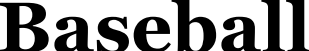

		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  True
		 strikeout  =  False
		 pixel_font_size  =  51.0
		 italic  =  False
		 font_weight  =  665
		 font_type  =  SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.0, 'green': 0.0, 'red': 0.0}
		 letter_spacing  =  0.0
		 font_size  =  12


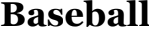

		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  True
		 strikeout  =  False
		 pixel_font_size  =  34.0
		 italic  =  False
		 font_weight  =  677
		 font_type  =  SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.0, 'green': 0.0, 'red': 0.0}
		 letter_spacing  =  0.0
		 font_size  =  8


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  True
		 strikeout  =  False
		 pixel_font_size  =  28.0
		 italic  =  False
		 font_weight  =  647
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.0, 'green': 0.0, 'red': 0.0}
		 letter_spacing  =  0.0
		 font_size  =  7


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  22.0
		 italic  =  False
		 font_weight  =  408
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.003921569, 'green': 0.003921569, 'red': 0.003921569}
		 letter_spacing  =  0.0
		 font_size  =  5


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  23.0
		 italic  =  False
		 font_weight  =  405
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.003921569, 'green': 0.003921569, 'red': 0.003921569}
		 letter_spacing  =  0.0
		 font_size  =  6


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  21.0
		 italic  =  False
		 font_weight  =  406
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.0627451, 'green': 0.0627451, 'red': 0.0627451}
		 letter_spacing  =  0.0
		 font_size  =  5


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  25.0
		 italic  =  False
		 font_weight  =  405
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.011764706, 'green': 0.011764706, 'red': 0.011764706}
		 letter_spacing  =  0.0
		 font_size  =  6


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  27.0
		 italic  =  False
		 font_weight  =  410
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.011764706, 'green': 0.011764706, 'red': 0.011764706}
		 letter_spacing  =  0.0
		 font_size  =  6


		 handwritten  =  False
		 smallcaps  =  False
		 superscript  =  False
		 underlined  =  False
		 background_color  =  {'blue': 1.0, 'green': 1.0, 'red': 1.0}
		 bold  =  False
		 strikeout  =  False
		 pixel_font_size  =  22.0
		 italic  =  False
		 font_weight  =  413
		 font_type  =  SANS_SERIF
		 subscript  =  False
		 text_color  =  {'blue': 0.003921569, 'green': 0.003921569, 'red': 0.003921569}
		 letter_spacing  =  0.0
		 font_size  =  5


In [187]:
for i in idx:
    style = extractor(f'response.pages[0].tokens[{i}].style_info')[0]
    normalized_vertices = extractor(f'response.pages[0].tokens[{i}].layout.bounding_poly.normalized_vertices as normalized_vertices')[0]
    crop = image.copy().crop(
     (
         int(min([v['x'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['width']),
         int(min([v['y'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['height']),
         int(max([v['x'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['width']),
         int(max([v['y'] for v in normalized_vertices['normalized_vertices']]) * image_info['image']['height'])
     )
    ) # (left, upper, right, lower)
    IPython.display.display(crop)
    for key in style['style_info'].keys():
        print('\t\t', key, ' = ', style['style_info'][key])


### Entities

Entities are extracted key:value pairs from the overall document.  Each parser has specific entities it is trained to detect and return.  In this case, the OCR Parser, there are not any default entities detected, however, the processing request included a `process_options` setting for `enable_image_quality_scores = True` that includes entities related to image quality for the document.

```
        process_options = documentai.ProcessOptions(
            from_start = 5,
            ocr_config = documentai.OcrConfig(
                enable_symbol = True,
                enable_image_quality_scores = True,
                premium_features = documentai.OcrConfig.PremiumFeatures(
                    compute_style_info = True
                )
```

In [188]:
entities = extractor(f'response.entities')[0]['entities']
len(entities)

5

In [189]:
entities[0]

{'redacted': False,
 'id': '',
 'mention_id': '',
 'properties': [{'properties': [],
   'redacted': False,
   'id': '',
   'mention_id': '',
   'mention_text': '',
   'confidence': 1.0,
   'type_': 'quality/defect_document_cutoff'},
  {'properties': [],
   'redacted': False,
   'id': '',
   'mention_id': '',
   'mention_text': '',
   'confidence': 0.635657,
   'type_': 'quality/defect_glare'},
  {'properties': [],
   'redacted': False,
   'id': '',
   'mention_id': '',
   'mention_text': '',
   'confidence': 0.5,
   'type_': 'quality/defect_text_cutoff'}],
 'mention_text': '',
 'page_anchor': {'page_refs': [{'confidence': 0.0,
    'layout_id': '',
    'layout_type': 'LAYOUT_TYPE_UNSPECIFIED',
    'page': 0}]},
 'confidence': 0.9518429,
 'type_': 'quality_score'}

In [190]:
for entity in entities:
    try:
        pn = entity['page_anchor']['page_refs'][0]['page']
    except:
        pn = 0
    print('page ', pn, entity['type_'], entity['confidence'])
    if entity['properties']:
        for property in entity['properties']:
            print('\t', property['type_'], property['confidence'])

page  0 quality_score 0.9518429
	 quality/defect_document_cutoff 1.0
	 quality/defect_glare 0.635657
	 quality/defect_text_cutoff 0.5
page  1 quality_score 0.88142693
	 quality/defect_document_cutoff 1.0
	 quality/defect_glare 0.6109125
	 quality/defect_text_cutoff 0.5
page  2 quality_score 0.9358103
	 quality/defect_document_cutoff 1.0
	 quality/defect_glare 0.57176626
	 quality/defect_text_cutoff 0.5
page  3 quality_score 0.9472718
	 quality/defect_document_cutoff 1.0
	 quality/defect_glare 0.6569412
	 quality/defect_text_cutoff 0.5
page  4 quality_score 0.93732214
	 quality/defect_document_cutoff 1.0
	 quality/defect_glare 0.5888336
	 quality/defect_text_cutoff 0.5


---
## Extraction: Custom Components With BigQuery

Another advantage of using SQL for extraction is the ability to do complex query logic.  For instance, what if you wanted to group lines by their proximity? Then, extending the proximity idea to creating visual representation of lines from tokens, paragraphs from lines, and blocks from paragraphs.
This idea is using spatial information to create the components. 

### Spatial Extraction From Document AI Responses: Using Tokens To Create Chunks

In the extraction examples above each component detected by Document AI is extracted and annotated on the pages for visual review: blocks, paragraphs, lines, tokens, symbols.  What is interesting about this current example is that both blocks and paragraphs are not different and the paragraphs seem to miss the visual separation between the paragraphs.

The following SQL query uses BigQuery [Geography Functions](https://cloud.google.com/bigquery/docs/reference/standard-sql/geography_functions) to create spatial grouping of the tokens. This is done by:
- Converting the tokens `normalized_vertices` to point geographies with `ST_GEOGPOINT`
- Converting the set of point geographies for a token into a polygon with `ST_MAKEPOLYGON` and `ST_MAKELINE`
- Clustering the token polygons within a page with `ST_CLUSTERDBSCAN` 
- Constructing new components from the identified cluster with `ST_BOUNDINGBOX` and `ST_UNION`
- Converting the new new components back into the `normalized_vertices` representation of Document AI responses


In [194]:
# Which part to use as the bases for finding groupsing = clusters
part = 'token'

# Which file to analyze - edit the query to remove where condition for file and this will run across the full table
file = '../shared files/docs/sports/Baseball - Wikipedia.pdf'

# This query runs across all pages of the file specified and returns the new `spatial_components`
query = f'''
        WITH
            page_info AS (
                SELECT
                    process.file as file,
                    pages.page_number as page_number,
                    pages.image as page_image
                FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`,
                    UNNEST(response.pages) AS pages WITH OFFSET AS page
                WHERE process.file = '{file}'
            ),
            components AS (
                SELECT
                    process.file as file,
                    pages.page_number as page_number,
                    {part},
                    STRING_AGG(
                        SUBSTRING(
                            response.text,
                            segments.start_index,
                            segments.end_index - segments.start_index
                        )
                    ) as text
                FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`,
                    UNNEST(response.pages) AS pages WITH OFFSET AS page,
                    UNNEST(pages.{part}s) AS {part}s WITH OFFSET AS {part},
                    UNNEST({part}s.layout.text_anchor.text_segments) AS segments WITH OFFSET as segment
                WHERE process.file = '{file}'
                GROUP BY file, page_number, {part}
            ),
            vertices AS (
                SELECT
                    process.file as file,
                    pages.page_number as page_number,
                    {part},
                    ARRAY_AGG(vertices) as vertices,
                    ARRAY_AGG(ST_GEOGPOINT(vertices.x, vertices.y)) as geo_vertices
                FROM `{ds.reference.project}.{ds.reference.dataset_id}.{BQ_TABLE_PREFIX}`,
                    UNNEST(response.pages) AS pages WITH OFFSET AS page,
                    UNNEST(pages.{part}s) AS {part}s WITH OFFSET AS {part},
                    UNNEST({part}s.layout.bounding_poly.normalized_vertices) AS vertices WITH OFFSET as vertex
                WHERE process.file = '{file}'
                GROUP BY file, page_number, {part}
            ),
            geo_combo AS (
                SELECT *,
                    ST_MAKEPOLYGON(ST_MAKELINE(geo_vertices)) AS geo_polygon
                FROM components
                LEFT OUTER JOIN vertices
                    USING (file, page_number, {part})
                ORDER BY file, page_number, {part}
            ),
            geo_cluster AS (
                SELECT
                    file,
                    page_number,
                    cluster_num,
                    STRING_AGG(text) as text,
                    ST_BOUNDINGBOX(ST_UNION_AGG(geo_polygon)) as geo_polygon
                FROM (
                    SELECT *,
                        ST_CLUSTERDBSCAN(geo_polygon, 1e3, 1) OVER(PARTITION BY file, page_number) AS cluster_num
                    FROM geo_combo            
                )
                GROUP BY file, page_number, cluster_num
           
            ),
            geo_page AS (
                SELECT
                    file,
                    page_number,
                    ANY_VALUE(page_image) AS page_image,
                    ARRAY_AGG(
                        STRUCT(
                            cluster_num,
                            text,
                            [
                                STRUCT(geo_polygon.ymin AS y, geo_polygon.xmin AS x),
                                STRUCT(geo_polygon.ymin AS y, geo_polygon.xmax AS x),
                                STRUCT(geo_polygon.ymax AS y, geo_polygon.xmax AS x),
                                STRUCT(geo_polygon.ymax AS y, geo_polygon.xmin AS x)
                            ] AS normalized_vertices
                        )
                    ) as cluster
                FROM geo_cluster
                LEFT OUTER JOIN page_info
                    USING(file, page_number)
                GROUP BY file, page_number
            )
        SELECT *
        FROM geo_page
'''
pages = [dict(row) for row in bq.query(query = query)]

In [195]:
len(pages)

5

In [196]:
pages[0].keys()

dict_keys(['file', 'page_number', 'page_image', 'cluster'])

In [197]:
pages[0]['cluster'][0].keys()

dict_keys(['cluster_num', 'text', 'normalized_vertices'])

In [198]:
pages[0]['page_image'].keys()

dict_keys(['height', 'width', 'mime_type', 'content'])

#### Add Annotations

Take the image with paragraphs annotated from above: `paragraph_image`.  Overlay annotations for each of the clusters:

In [199]:
for page in pages:
    if page['page_number'] == 1:
        image = PIL.Image.open(io.BytesIO(page['page_image']['content']))
        draw = PIL.ImageDraw.Draw(image)
        for part in page['cluster']:
            draw.polygon(
                [(v['x'] * paragraph_image.width, v['y'] * paragraph_image.height) for v in part['normalized_vertices']],
                outline = 'red',
                width = 5
            )

#### Before - Paragraph Outlines From Document AI:

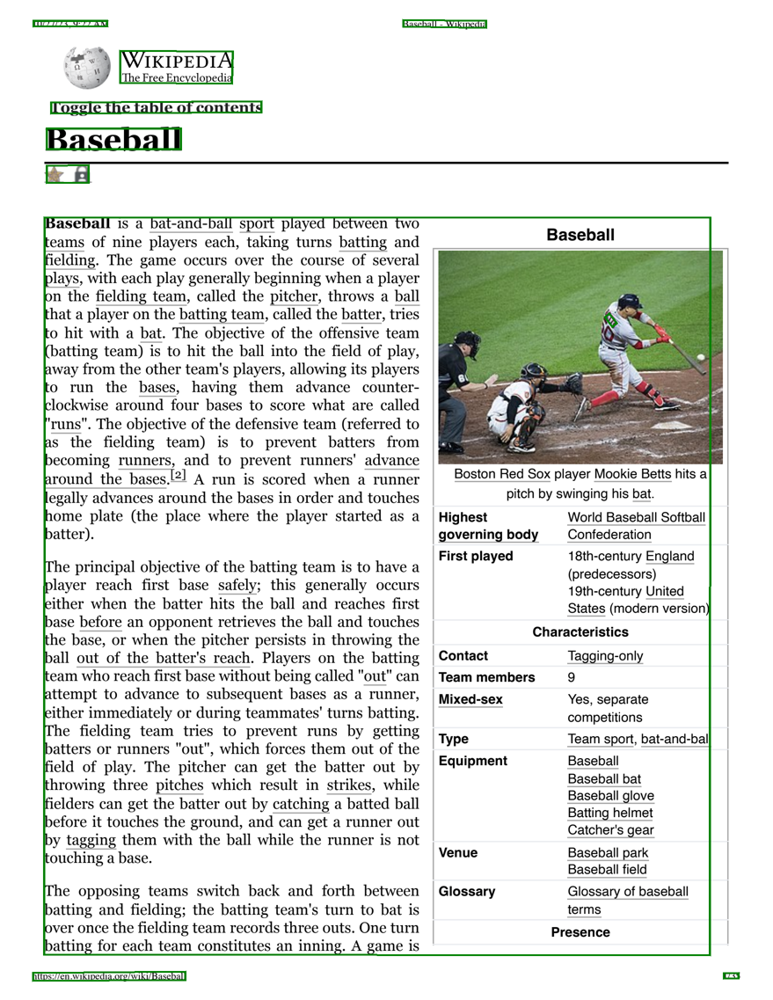

In [200]:
paragraph_image.resize((int(.5 * paragraph_image.width), int(.5 * paragraph_image.height)))

#### After - With the Spatial Clustering of Tokens From BigQuery Geograph Functions

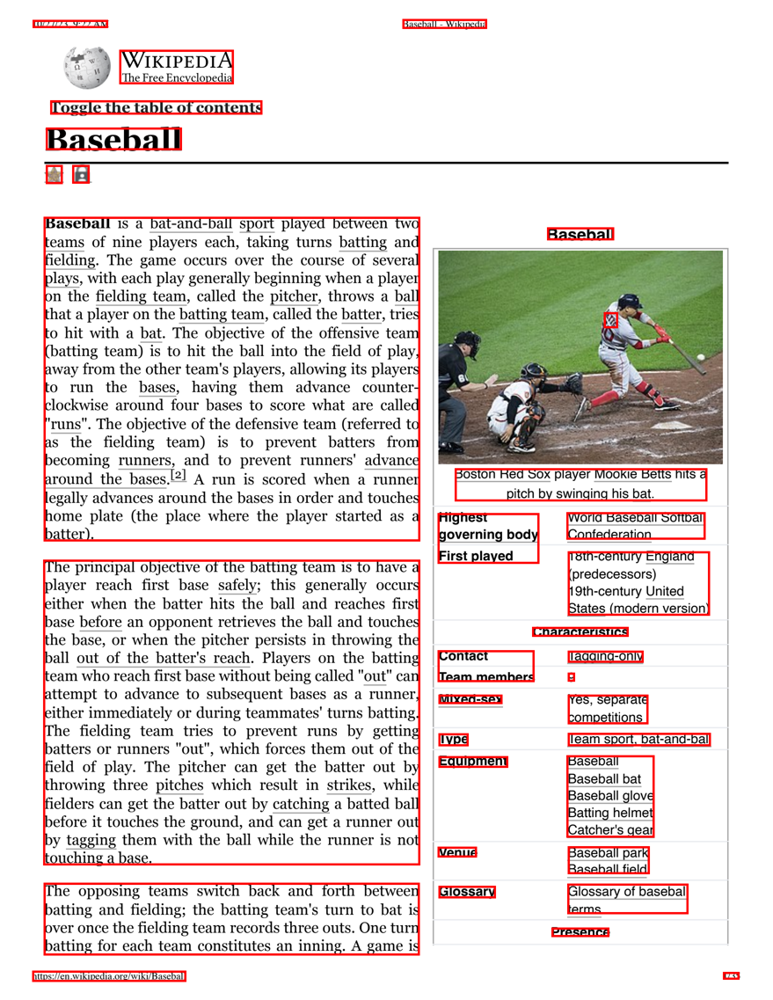

In [201]:
image.resize((int(.5 * image.width), int(.5 * image.height)))